In [1]:
#dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from matplotlib.lines import Line2D

In [2]:
#reading in the state abbreviations
path = '../google_trends/statesAbbrev.csv'
statesAbbrev_df = pd.read_csv(path)
statesAbbrev_df.tail(12)

,State,Abbrev,Code
39,Rhode Island,R.I.,RI
40,South Carolina,S.C.,SC
41,South Dakota,S.D.,SD
42,Tennessee,Tenn.,TN
43,Texas,Tex.,TX
44,Utah,Utah,UT
45,Vermont,Vt.,VT
46,Virginia,Va.,VA
47,Washington,Wash.,WA
48,West Virginia,W.Va.,WV


In [3]:
#list for state codes
state_codes = [x for x in statesAbbrev_df['Code']]

In [5]:
#list for state names
state_names = [x for x in statesAbbrev_df['State']]

In [6]:
[x.lower() for x in state_names]

['alabama',
 'alaska',
 'arizona',
 'arkansas',
 'california',
 'colorado',
 'connecticut',
 'delaware',
 'district of columbia',
 'florida',
 'georgia',
 'hawaii',
 'idaho',
 'illinois',
 'indiana',
 'iowa',
 'kansas',
 'kentucky',
 'louisiana',
 'maine',
 'maryland',
 'massachusetts',
 'michigan',
 'minnesota',
 'mississippi',
 'missouri',
 'montana',
 'nebraska',
 'nevada',
 'new hampshire',
 'new jersey',
 'new mexico',
 'new york',
 'north carolina',
 'north dakota',
 'ohio',
 'oklahoma',
 'oregon',
 'pennsylvania',
 'rhode island',
 'south carolina',
 'south dakota',
 'tennessee',
 'texas',
 'utah',
 'vermont',
 'virginia',
 'washington',
 'west virginia',
 'wisconsin',
 'wyoming']

In [7]:
state_names_for_files = ['alabama',
 'alaska',
 'arizona',
 'arkansas',
 'california',
 'colorado',
 'connecticut',
 'delaware',
 'district_of_columbia',
 'florida',
 'georgia',
 'hawaii',
 'idaho',
 'illinois',
 'indiana',
 'iowa',
 'kansas',
 'kentucky',
 'louisiana',
 'maine',
 'maryland',
 'massachusetts',
 'michigan',
 'minnesota',
 'mississippi',
 'missouri',
 'montana',
 'nebraska',
 'nevada',
 'new_hampshire',
 'new_jersey',
 'new_mexico',
 'new_york',
 'north_carolina',
 'north_dakota',
 'ohio',
 'oklahoma',
 'oregon',
 'pennsylvania',
 'rhode_island',
 'south_carolina',
 'south_dakota',
 'tennessee',
 'texas',
 'utah',
 'vermont',
 'virginia',
 'washington',
 'west virginia',
 'wisconsin',
 'wyoming']

In [17]:
#creating a df dict to hold the state dfs, reading in the dfs
states_df_dict = {}
for x in range(40, 51):
    path = f'../google_trends/google_trends_csvs/state_csvs/US-{state_codes[x]}_cat_data.csv'
    states_df_dict[f'{state_codes[x]}_data_df'] = [pd.read_csv(path)]

In [18]:
#inspecting the keys (ie df names)
states_df_dict.keys()

dict_keys(['SC_data_df', 'SD_data_df', 'TN_data_df', 'TX_data_df', 'UT_data_df', 'VT_data_df', 'VA_data_df', 'WA_data_df', 'WV_data_df', 'WI_data_df', 'WY_data_df'])

In [19]:
#test printing a df
print(state_codes[40])
states_df_dict[f'{state_codes[40]}_data_df'][0].head(10)

SC


,time,arts_entertainment,autos,beauty_fitness,books_lit,action_adventure,campaigns_elections,celebs,discrimination,entertainment_media,...,mobiles,online_vids,scifi_fantasy,sport_news,tv_shows,voice_vid_chat,weather,covid_cases,stay_at_home,mass_gathering_ban
0,2019-01-06,96,78,70,87,68,0,65,22,68,...,60,92,66,80,91,37,59,NaN,False,False
1,2019-01-13,95,76,73,87,74,0,66,10,83,...,61,87,54,48,79,35,68,NaN,False,False
2,2019-01-20,88,80,71,81,69,0,61,18,73,...,62,83,55,54,89,41,68,NaN,False,False
3,2019-01-27,93,76,70,83,71,0,66,17,80,...,61,94,43,44,83,48,69,NaN,False,False
4,2019-02-03,92,78,72,88,65,0,61,26,60,...,61,81,42,73,89,58,57,NaN,False,False
5,2019-02-10,95,80,68,92,58,0,63,20,72,...,64,91,51,47,78,43,70,NaN,False,False
6,2019-02-17,95,82,76,90,66,0,78,23,67,...,67,91,40,40,83,53,80,NaN,False,False
7,2019-02-24,100,84,73,94,64,0,69,25,68,...,64,87,55,45,86,70,74,NaN,False,False
8,2019-03-03,97,82,72,93,63,0,59,46,75,...,70,89,51,39,91,52,76,NaN,False,False
9,2019-03-10,93,83,68,86,55,0,68,22,66,...,64,84,46,63,84,55,58,NaN,False,False


In [11]:
col_names = list(states_df_dict[f'{state_codes[40]}_data_df'][0].columns)

In [12]:
col_names_for_max = [x for x in col_names if x not in ['time', 'covid_cases', 'stay_at_home', 'mass_gathering_ban']]

In [13]:
times_list = list(states_df_dict[f'{state_codes[40]}_data_df'][0]['time'])

In [25]:
for x in range(40, 51):
    states_df_dict[f'{state_codes[x]}_data_df'][0]['covid_cases'] = states_df_dict[f'{state_codes[x]}_data_df'][0]['covid_cases'].fillna(0)

In [26]:
states_df_dict[f'{state_codes[44]}_data_df'][0].head()

,time,arts_entertainment,autos,beauty_fitness,books_lit,action_adventure,campaigns_elections,celebs,discrimination,entertainment_media,...,mobiles,online_vids,scifi_fantasy,sport_news,tv_shows,voice_vid_chat,weather,covid_cases,stay_at_home,mass_gathering_ban
0,2019-01-06,98,64,96,94,57,0,57,20,85,...,58,85,47,65,91,26,57,0.0,False,False
1,2019-01-13,93,63,96,86,71,0,58,29,78,...,60,84,44,66,88,26,66,0.0,False,False
2,2019-01-20,92,62,89,86,72,0,57,32,76,...,58,74,39,55,85,31,58,0.0,False,False
3,2019-01-27,92,61,91,87,53,0,64,32,81,...,51,75,35,54,81,57,53,0.0,False,False
4,2019-02-03,93,64,91,81,70,0,58,27,72,...,49,73,47,73,86,53,91,0.0,False,False


In [45]:
def tvfilm_graph_maker(ind_no):
    all_data_df = states_df_dict[f'{state_codes[ind_no]}_data_df'][0]
    
    graphs_time_list = [x for x in all_data_df['time']]
    init_covid_list = [x for x in all_data_df['covid_cases']]
    
    fig, ax = plt.subplots(figsize=(30,7))

    ax.plot(graphs_time_list, all_data_df['action_adventure'], color='red', label='action/adventure')

    ax.plot(graphs_time_list, all_data_df['scifi_fantasy'], color='orange', label='scifi_fantasy')

    ax.plot(graphs_time_list, all_data_df['tv_shows'], color='purple', label='tv_shows')

    ax.plot(graphs_time_list, all_data_df['online_vids'], color='green', label='online_video')

    plt.xticks(graphs_time_list, rotation=90)

    plt.xlabel('date')
    plt.ylabel('% popularity')
    plt.legend(loc='upper left')
    plt.title(f'{state_names[ind_no]}: Category Popularity in Group TV/Film, and Covid Cases, 2019-2020')

    ax2 = ax.twinx()
    colour_list = []
    for x in all_data_df['stay_at_home']:
        if x == True:
            colour_list.append('green')
        else:
            colour_list.append('blue')
    ax2.set_ylabel('covid_cases')  
    ax2.bar(graphs_time_list, init_covid_list, color=colour_list, align='center', alpha=0.3)
    ax2.tick_params(axis='y')
    
    custom_lines = [Line2D([0], [0], color='green', alpha=0.5, lw=4),
                Line2D([0], [0], color='blue', alpha=0.5, lw=4)]

    ax2.legend(custom_lines, ['stay_at_home in effect', 'no stay_at_home'], loc='lower left')
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    
    plt.savefig(f'graphs_for_states/combined_2019_2020_graphs/tv_film/{state_names_for_files[ind_no]}_tv_film_cats_graph.png')

    plt.show()

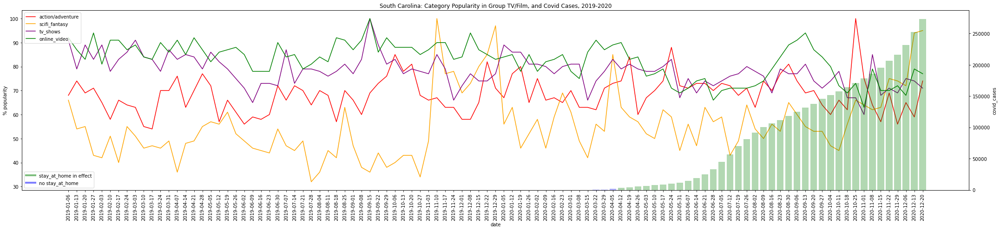

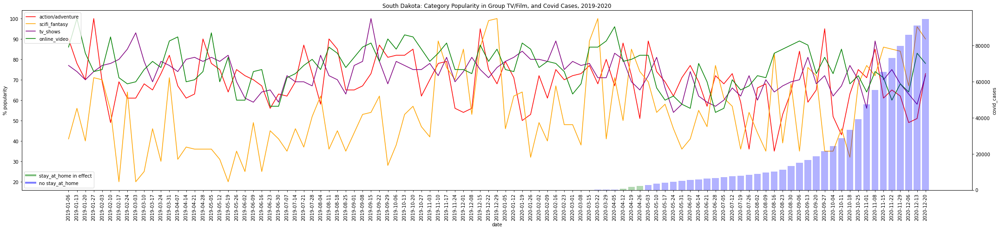

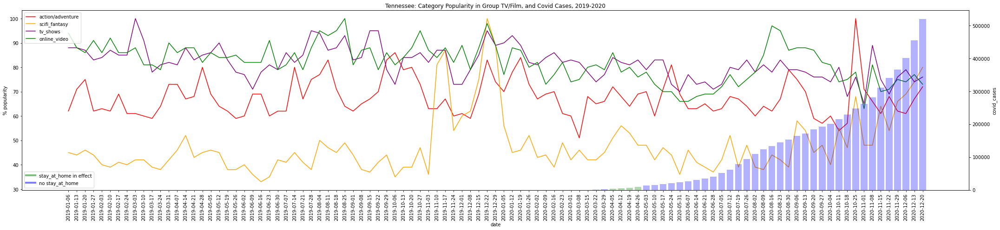

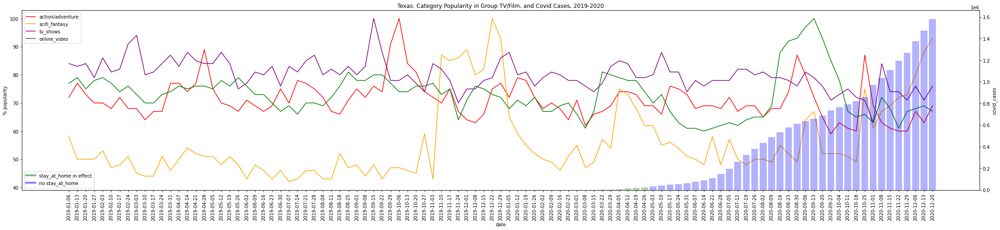

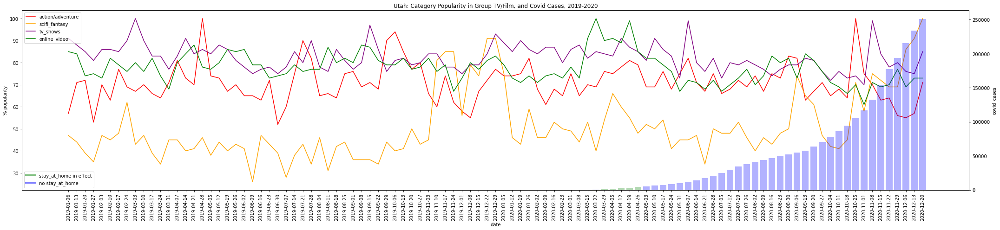

...

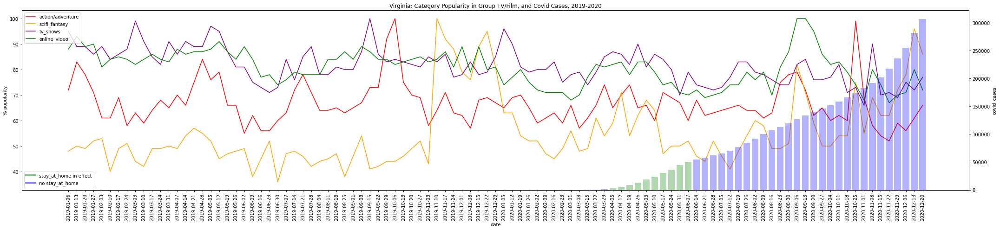

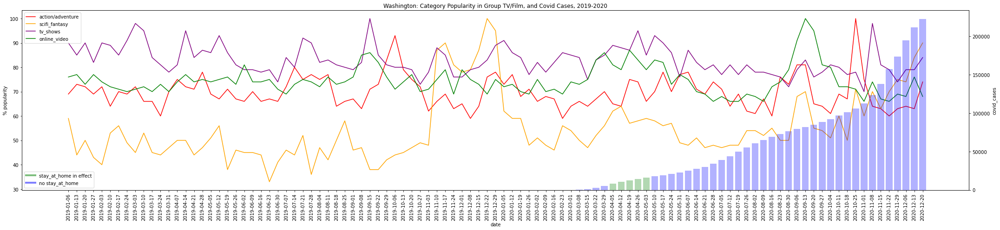

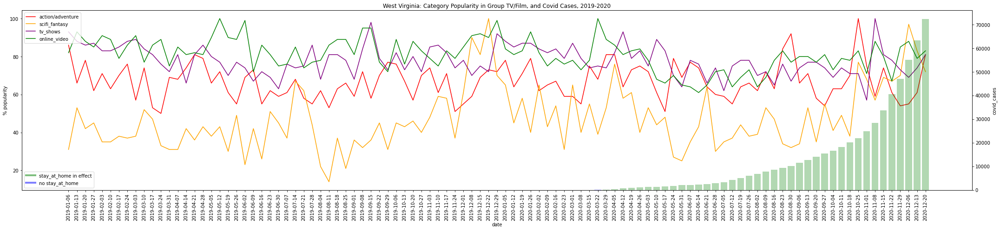

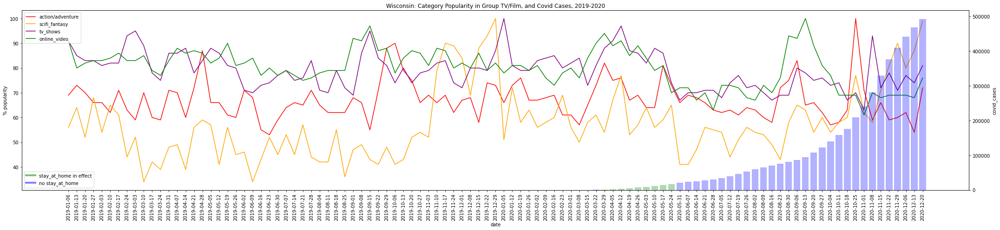

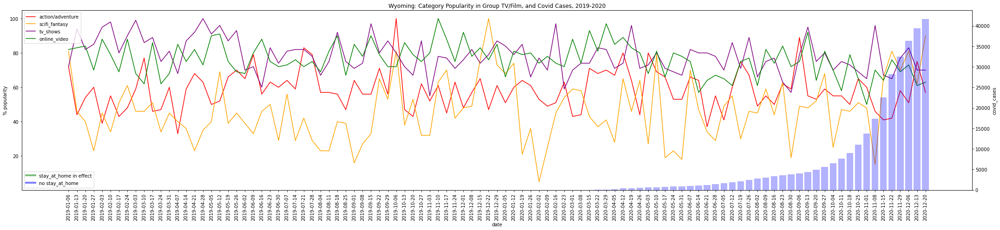

In [46]:
for x in range(40, 51):
    tvfilm_graph_maker(x)

In [47]:
def comms_graph_maker(ind_no):
    all_data_df = states_df_dict[f'{state_codes[ind_no]}_data_df'][0]
    
    graphs_time_list = [x for x in all_data_df['time']]
    init_covid_list = [x for x in all_data_df['covid_cases']]
    
    fig, ax = plt.subplots(figsize=(30,7))

    ax.plot(graphs_time_list, all_data_df['mobiles'], color='red', label='mobiles')

    ax.plot(graphs_time_list, all_data_df['voice_vid_chat'], color='purple', label='voice/video_chat')

    plt.xticks(graphs_time_list, rotation=90)

    plt.xlabel('date')
    plt.ylabel('% popularity')
    plt.legend(loc='upper left')
    plt.title(f'{state_names[ind_no]}: Category Popularity in Group Communication, and Covid Cases, 2019-2020')

    ax2 = ax.twinx()
    colour_list = []
    for x in all_data_df['stay_at_home']:
        if x == True:
            colour_list.append('green')
        else:
            colour_list.append('blue')
    ax2.set_ylabel('covid_cases')  
    ax2.bar(graphs_time_list, init_covid_list, color=colour_list, align='center', alpha=0.3)
    ax2.tick_params(axis='y')
    
    custom_lines = [Line2D([0], [0], color='green', alpha=0.5, lw=4),
                Line2D([0], [0], color='blue', alpha=0.5, lw=4)]

    ax2.legend(custom_lines, ['stay_at_home in effect', 'no stay_at_home'], loc='lower left')
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    
    plt.savefig(f'graphs_for_states/combined_2019_2020_graphs/communications/{state_names_for_files[ind_no]}_comms_cats_graph.png')

    plt.show()

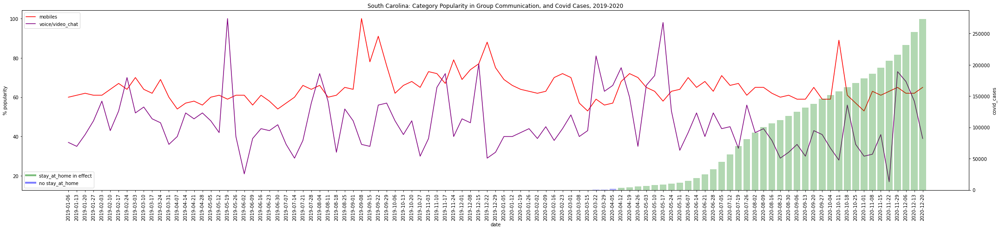

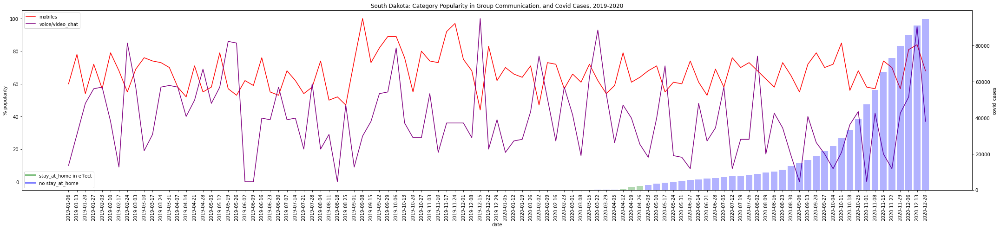

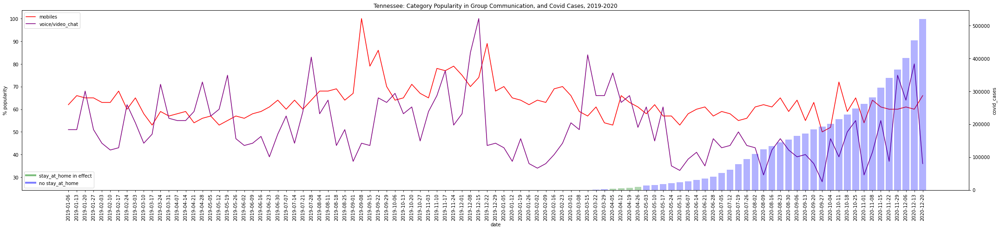

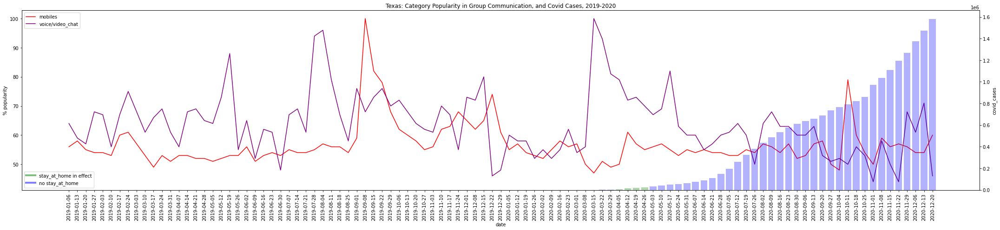

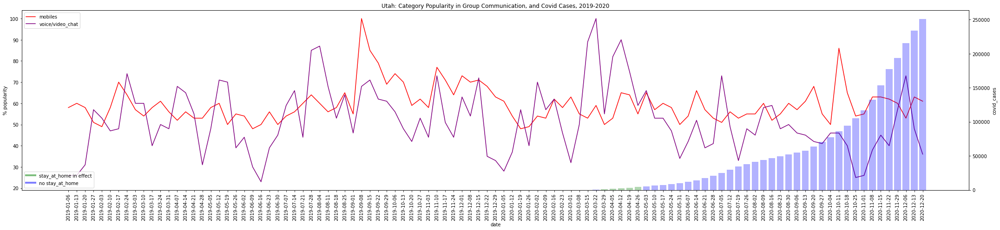

...

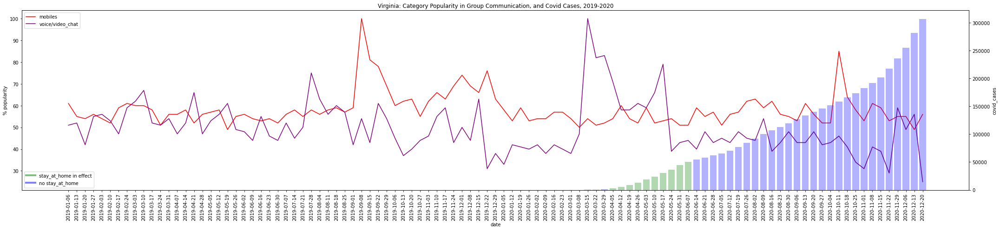

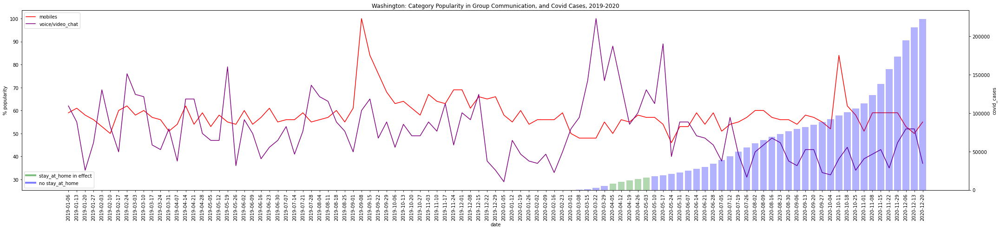

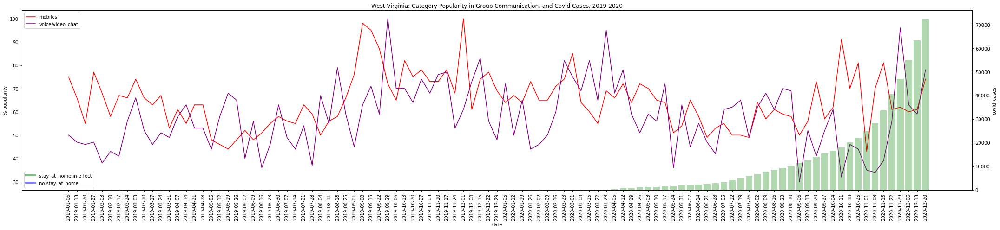

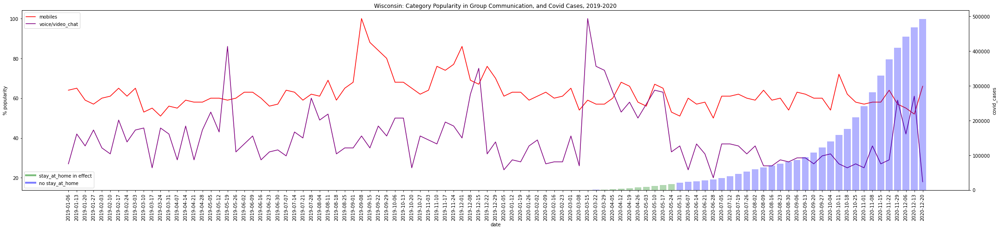

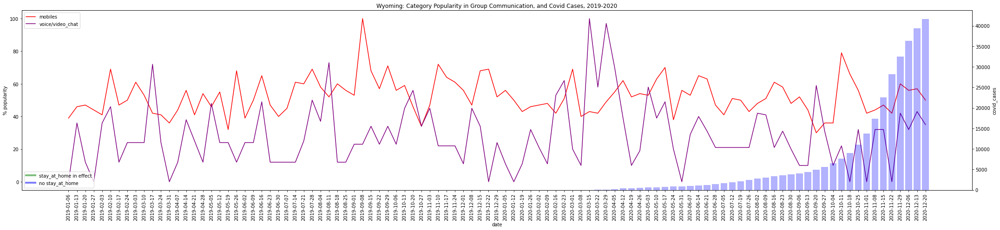

In [48]:
for x in range(40, 51):
    comms_graph_maker(x)

In [49]:
def health_graph_maker(ind_no):
    all_data_df = states_df_dict[f'{state_codes[ind_no]}_data_df'][0]
    
    graphs_time_list = [x for x in all_data_df['time']]
    init_covid_list = [x for x in all_data_df['covid_cases']]
    
    fig, ax = plt.subplots(figsize=(30,7))

    ax.plot(graphs_time_list, all_data_df['infectious_diseases'], color='orange', label='infectious diseases')

    ax.plot(graphs_time_list, all_data_df['health_news'], color='brown', label='health news')

    plt.xticks(graphs_time_list, rotation=90)

    plt.xlabel('date')
    plt.ylabel('% popularity')
    plt.legend(loc='upper left')
    plt.title(f'{state_names[ind_no]}: Category Popularity in Group Health, and Covid Cases, 2019-2020')

    ax2 = ax.twinx()
    colour_list = []
    for x in all_data_df['stay_at_home']:
        if x == True:
            colour_list.append('green')
        else:
            colour_list.append('blue')
    ax2.set_ylabel('covid_cases')  
    ax2.bar(graphs_time_list, init_covid_list, color=colour_list, align='center', alpha=0.3)
    ax2.tick_params(axis='y')
    
    custom_lines = [Line2D([0], [0], color='green', alpha=0.5, lw=4),
                Line2D([0], [0], color='blue', alpha=0.5, lw=4)]

    ax2.legend(custom_lines, ['stay_at_home in effect', 'no stay_at_home'], loc='lower left')
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    
    plt.savefig(f'graphs_for_states/combined_2019_2020_graphs/health/{state_names_for_files[ind_no]}_health_cats_graph.png')
    
    plt.show()

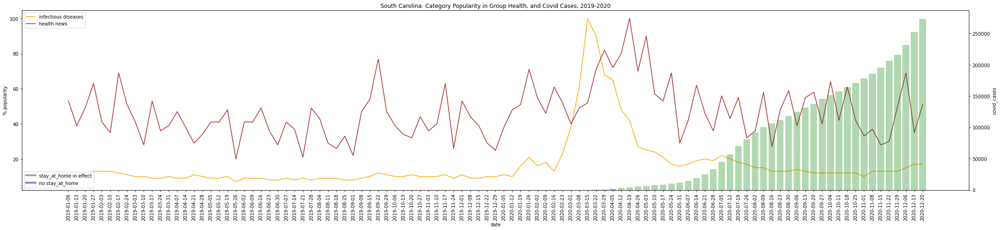

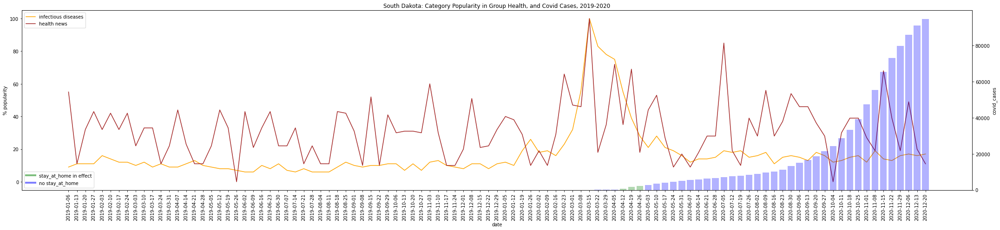

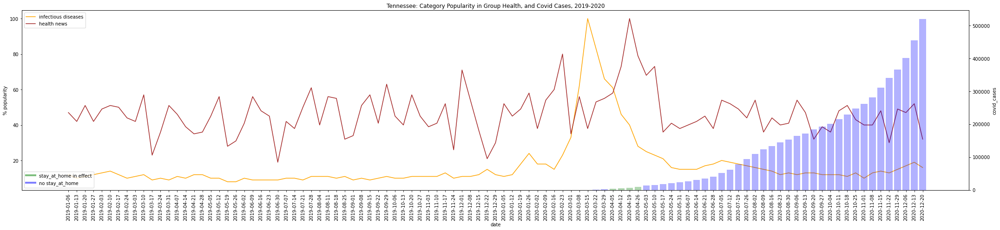

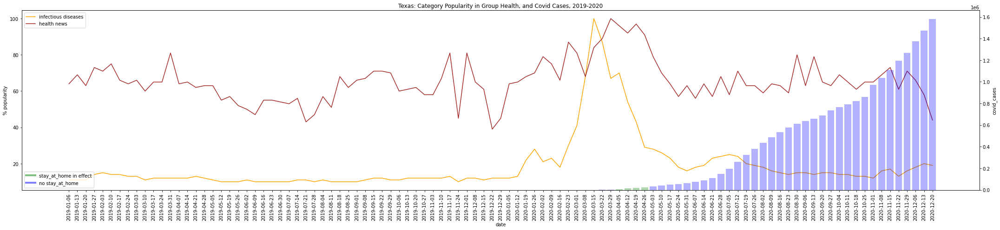

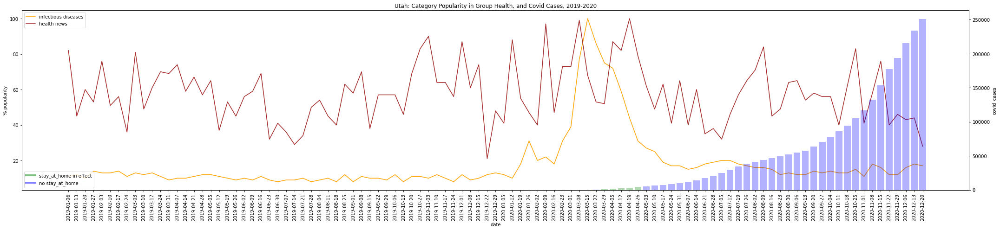

...

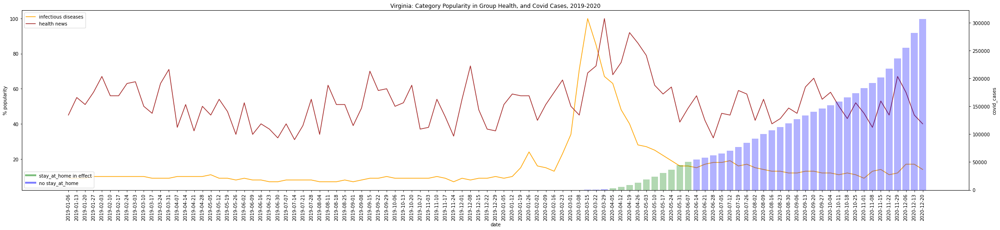

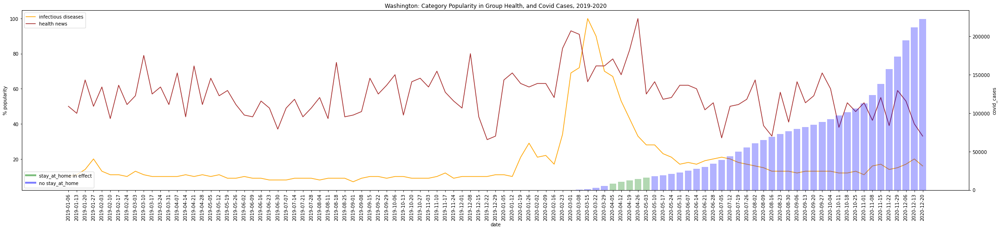

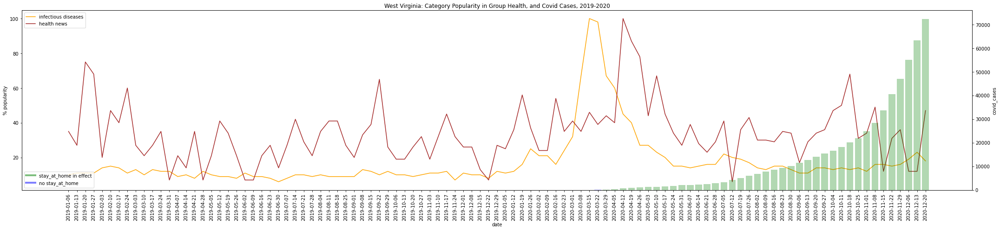

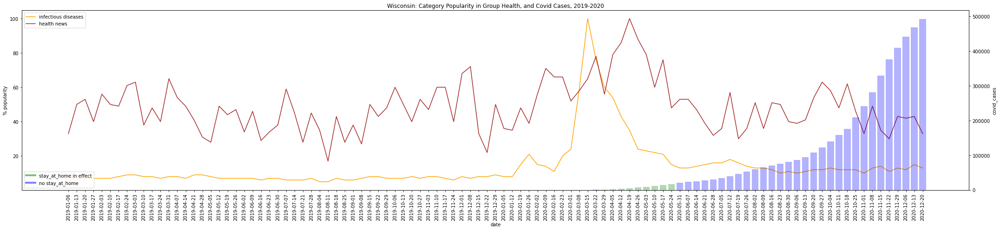

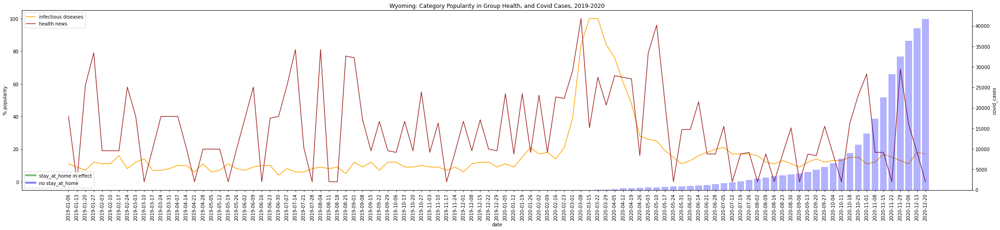

In [50]:
for x in range(40, 51):
    health_graph_maker(x)

In [51]:
def ent_other_gc_graph_maker(ind_no):
    all_data_df = states_df_dict[f'{state_codes[ind_no]}_data_df'][0]
    
    graphs_time_list = [x for x in all_data_df['time']]
    init_covid_list = [x for x in all_data_df['covid_cases']]
    
    fig, ax = plt.subplots(figsize=(30,7))

    ax.plot(graphs_time_list, all_data_df['games_systems_consoles'], color='red', label='games, systems, consoles')

    ax.plot(graphs_time_list, all_data_df['lottos'], color='green', label='lottery & sweepstakes')
    
    ax.plot(graphs_time_list, all_data_df['celebs'], color='brown', label='celebrity news')

    plt.xticks(graphs_time_list, rotation=90)

    plt.xlabel('date')
    plt.ylabel('% popularity')
    plt.legend(loc='upper left')
    plt.title(f'{state_names[ind_no]}: Category Popularity in Group Other Entertainment (Games & Celebs), and Covid Cases, 2019-2020')

    ax2 = ax.twinx()
    colour_list = []
    for x in all_data_df['stay_at_home']:
        if x == True:
            colour_list.append('green')
        else:
            colour_list.append('blue')
    ax2.set_ylabel('covid_cases')  
    ax2.bar(graphs_time_list, init_covid_list, color=colour_list, align='center', alpha=0.3)
    ax2.tick_params(axis='y')
    
    custom_lines = [Line2D([0], [0], color='green', alpha=0.5, lw=4),
                Line2D([0], [0], color='blue', alpha=0.5, lw=4)]

    ax2.legend(custom_lines, ['stay_at_home in effect', 'no stay_at_home'], loc='lower left')
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    
    plt.savefig(f'graphs_for_states/combined_2019_2020_graphs/ent_games_celebs/{state_names_for_files[ind_no]}_ent_gc_cats_graph.png')

    plt.show()

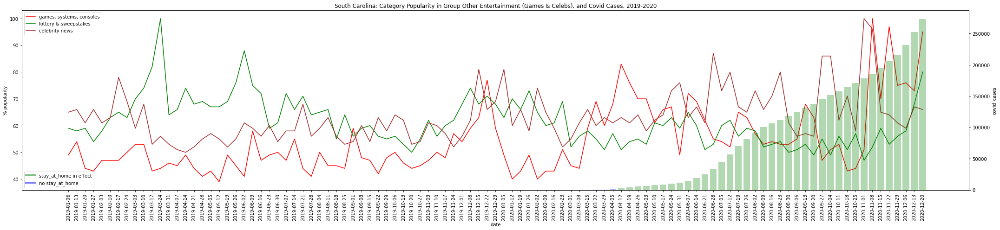

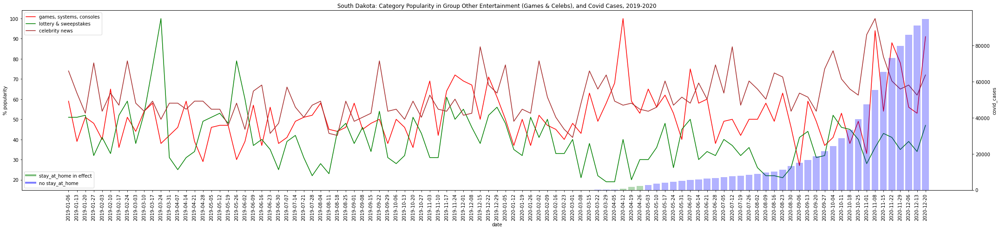

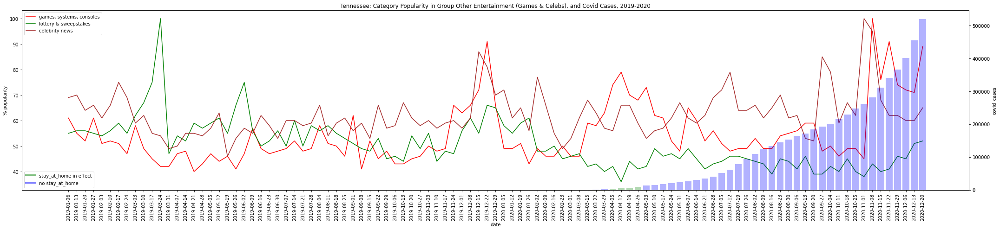

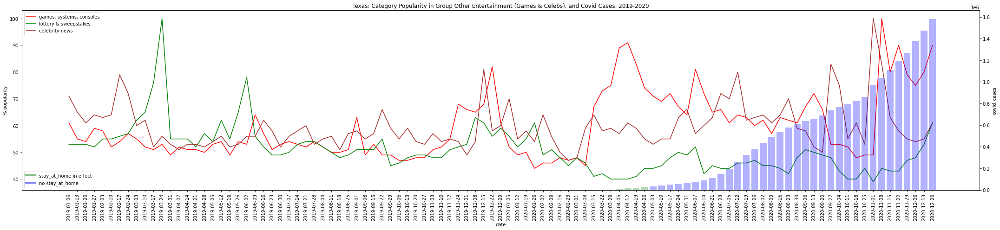

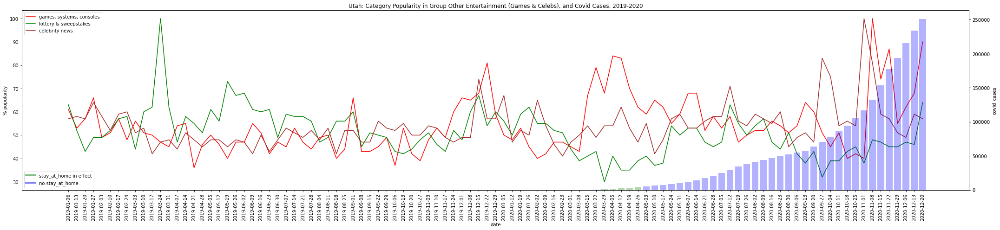

...

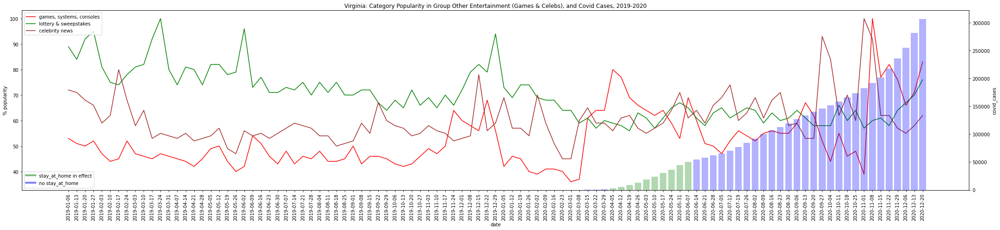

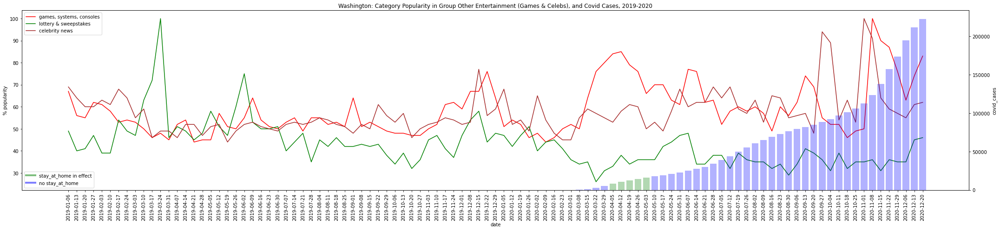

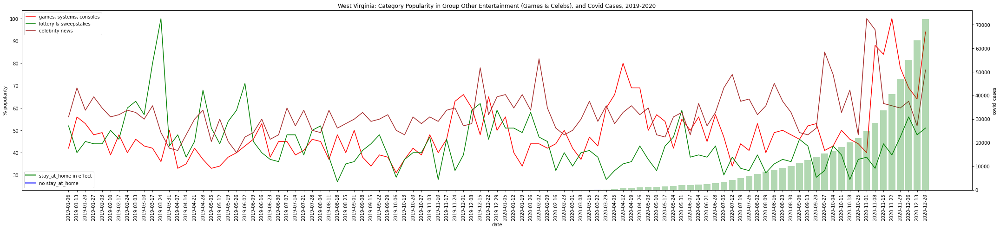

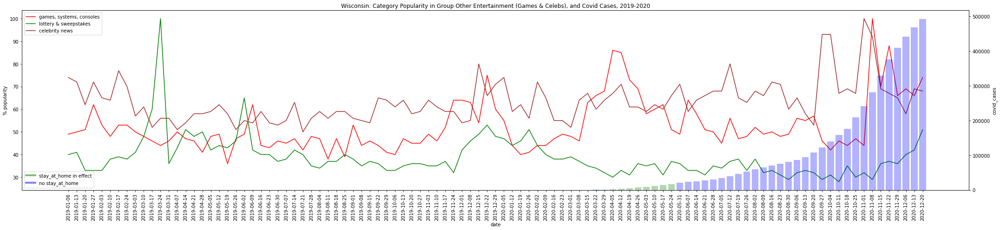

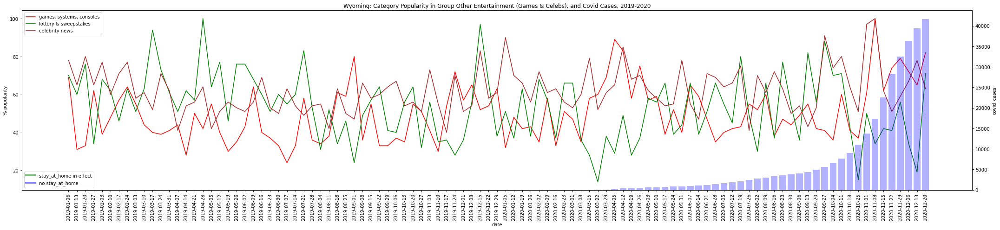

In [52]:
for x in range(40, 51):
    ent_other_gc_graph_maker(x)

In [53]:
def ent_other_gen_med_graph_maker(ind_no):
    all_data_df = states_df_dict[f'{state_codes[ind_no]}_data_df'][0]
    
    graphs_time_list = [x for x in all_data_df['time']]
    init_covid_list = [x for x in all_data_df['covid_cases']]
    
    fig, ax = plt.subplots(figsize=(30,7))

    ax.plot(graphs_time_list, all_data_df['arts_entertainment'], color='orange', label='arts & entertainment')

    ax.plot(graphs_time_list, all_data_df['books_lit'], color='purple', label='books & lit')
    
    ax.plot(graphs_time_list, all_data_df['entertainment_media'], color='cyan', label='entertainment media')

    plt.xticks(graphs_time_list, rotation=90)

    plt.xlabel('date')
    plt.ylabel('% popularity')
    plt.legend(loc='upper left')
    plt.title(f'{state_names[ind_no]}: Category Popularity in Group Other Entertainment (General & Media), and Covid Cases, 2019-2020')

    ax2 = ax.twinx()
    colour_list = []
    for x in all_data_df['stay_at_home']:
        if x == True:
            colour_list.append('green')
        else:
            colour_list.append('blue')
    ax2.set_ylabel('covid_cases')  
    ax2.bar(graphs_time_list, init_covid_list, color=colour_list, align='center', alpha=0.3)
    ax2.tick_params(axis='y')
    
    custom_lines = [Line2D([0], [0], color='green', alpha=0.5, lw=4),
                Line2D([0], [0], color='blue', alpha=0.5, lw=4)]

    ax2.legend(custom_lines, ['stay_at_home in effect', 'no stay_at_home'], loc='lower left')
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    
    plt.savefig(f'graphs_for_states/combined_2019_2020_graphs/ent_books_media_gen/{state_names_for_files[ind_no]}_ent_bmg_cats_graph.png')

    plt.show()

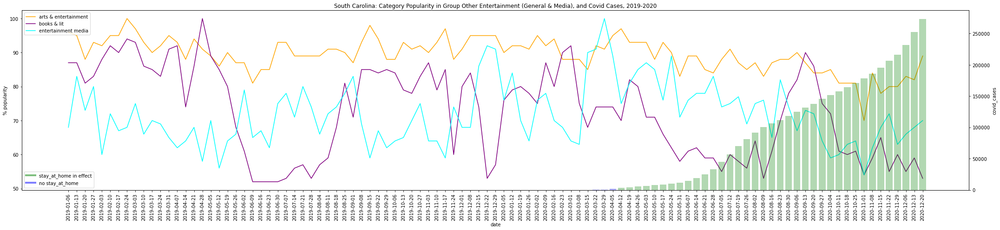

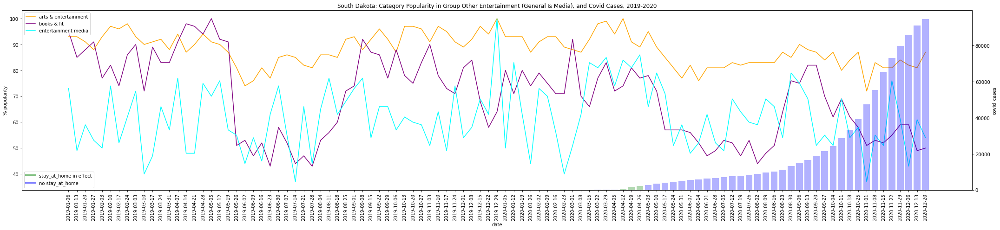

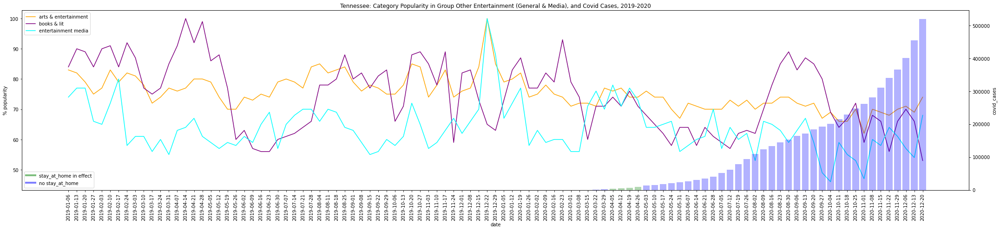

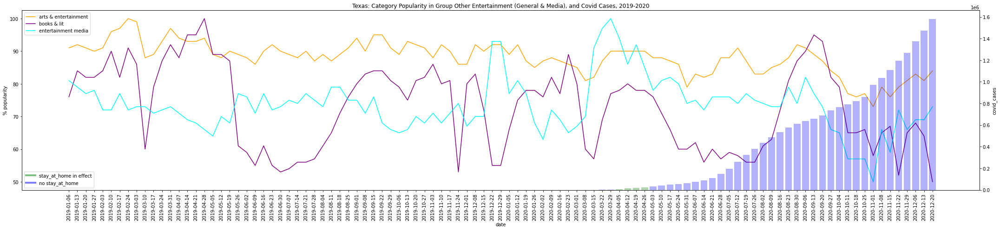

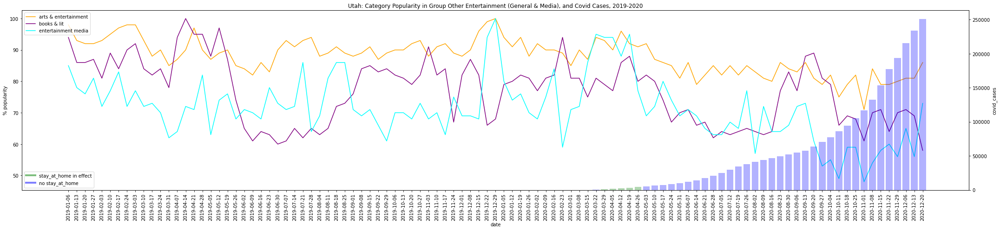

...

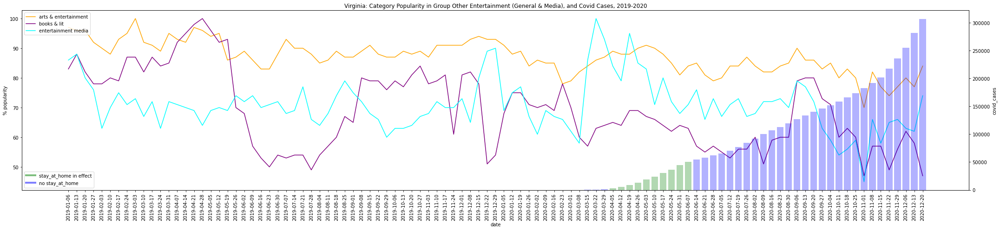

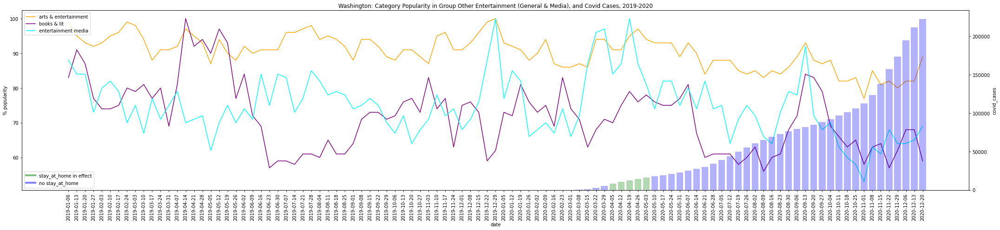

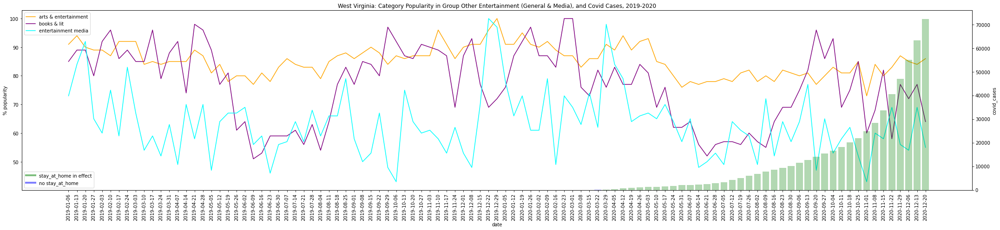

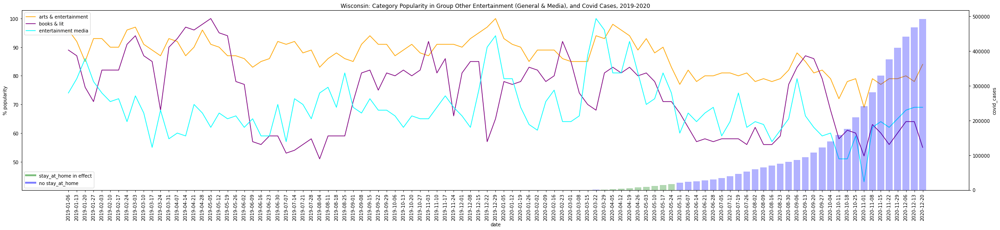

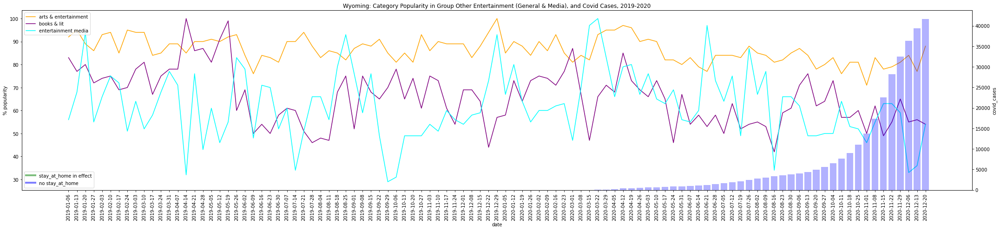

In [54]:
for x in range(40, 51):
    ent_other_gen_med_graph_maker(x)

In [55]:
def election_graph_maker(ind_no):
    all_data_df = states_df_dict[f'{state_codes[ind_no]}_data_df'][0]
    
    graphs_time_list = [x for x in all_data_df['time']]
    init_covid_list = [x for x in all_data_df['covid_cases']]
    
    fig, ax = plt.subplots(figsize=(30,7))

    ax.plot(graphs_time_list, all_data_df['campaigns_elections'], color='red', label='campaigns & elections')

    plt.xticks(graphs_time_list, rotation=90)

    plt.xlabel('date')
    plt.ylabel('% popularity')
    plt.legend(loc='upper left')
    plt.title(f'{state_names[ind_no]}: Category Popularity in Group Campaigns & Elections, and Covid Cases, 2019-2020')

    ax2 = ax.twinx()
    colour_list = []
    for x in all_data_df['stay_at_home']:
        if x == True:
            colour_list.append('green')
        else:
            colour_list.append('blue')
    ax2.set_ylabel('covid_cases')  
    ax2.bar(graphs_time_list, init_covid_list, color=colour_list, align='center', alpha=0.3)
    ax2.tick_params(axis='y')
    
    custom_lines = [Line2D([0], [0], color='green', alpha=0.5, lw=4),
                Line2D([0], [0], color='blue', alpha=0.5, lw=4)]

    ax2.legend(custom_lines, ['stay_at_home in effect', 'no stay_at_home'], loc='lower left')
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    
    plt.savefig(f'graphs_for_states/combined_2019_2020_graphs/election/{state_names_for_files[ind_no]}_election_cats_graph.png')

    plt.show()

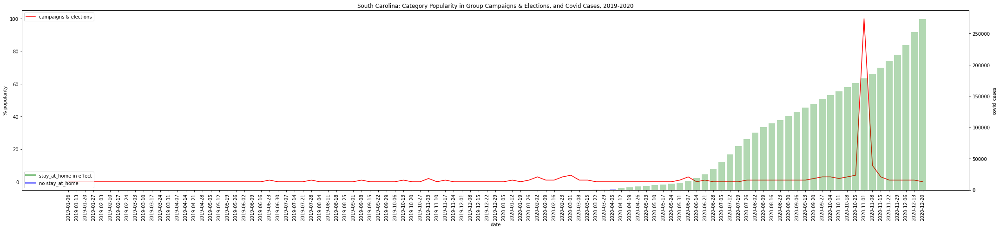

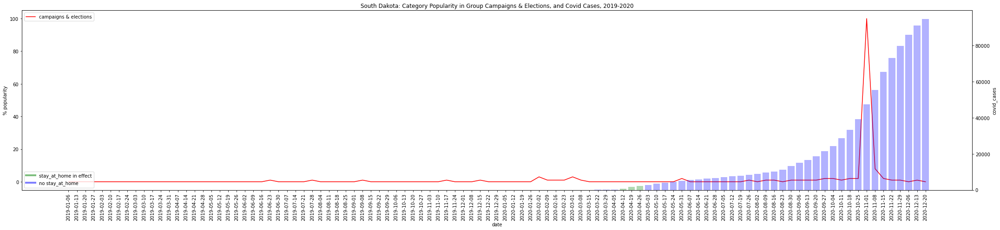

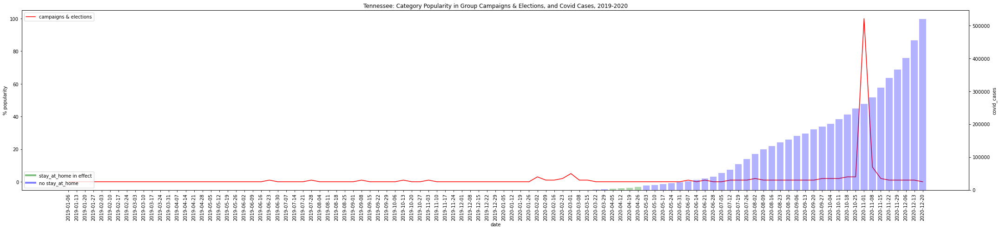

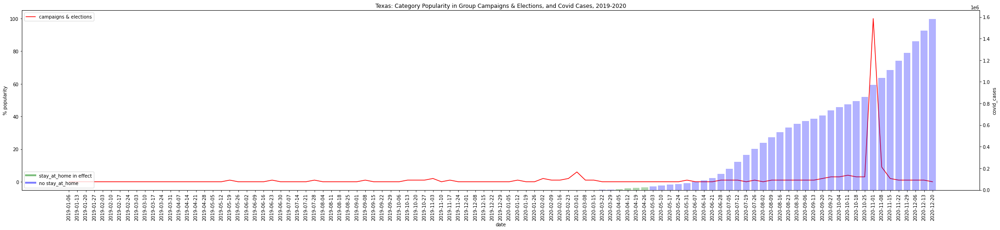

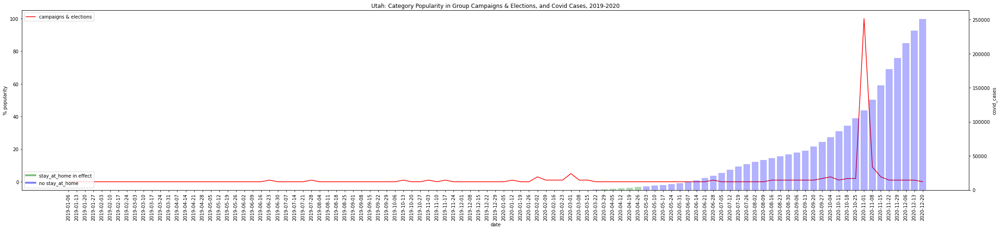

...

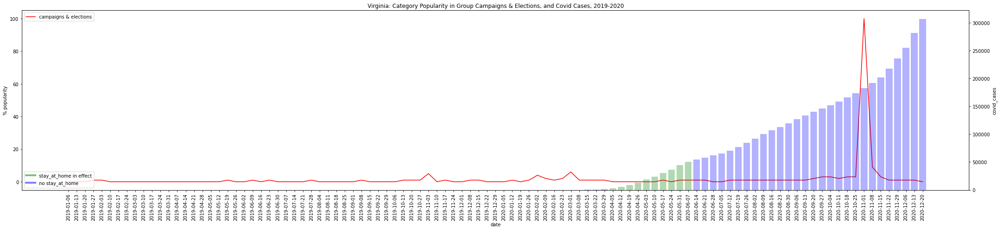

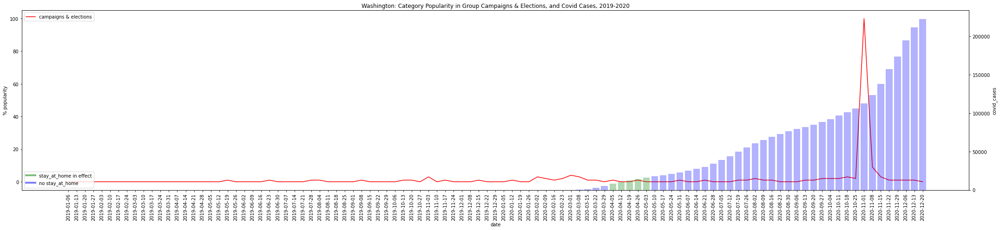

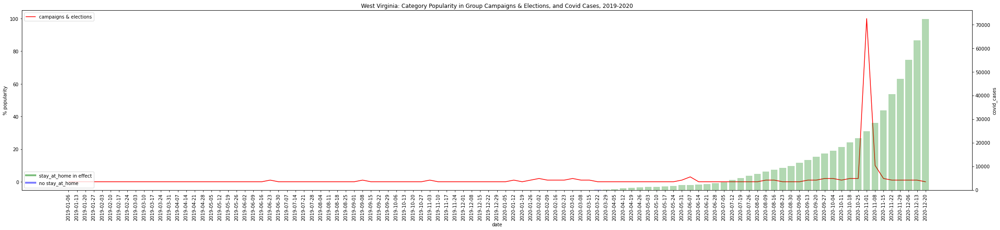

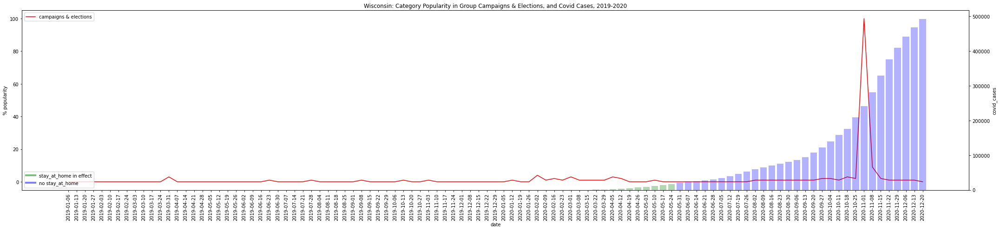

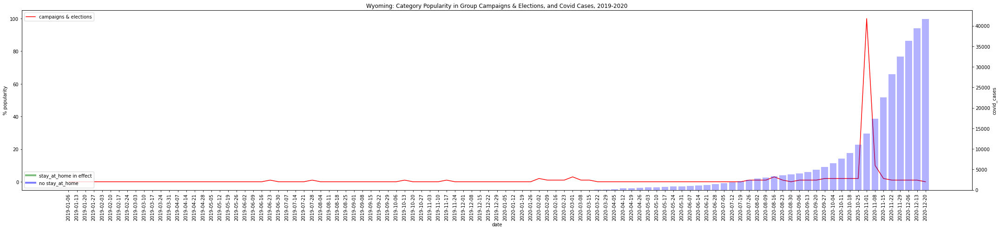

In [56]:
for x in range(40, 51):
    election_graph_maker(x)

In [57]:
def discrim_law_graph_maker(ind_no):
    all_data_df = states_df_dict[f'{state_codes[ind_no]}_data_df'][0]
    
    graphs_time_list = [x for x in all_data_df['time']]
    init_covid_list = [x for x in all_data_df['covid_cases']]
    
    fig, ax = plt.subplots(figsize=(30,7))

    ax.plot(graphs_time_list, all_data_df['discrimination'], color='mediumslateblue', label='discrimination')

    ax.plot(graphs_time_list, all_data_df['law_enf'], color='deeppink', label='law enforcement')

    plt.xticks(graphs_time_list, rotation=90)

    plt.xlabel('date')
    plt.ylabel('% popularity')
    plt.legend(loc='upper left')
    plt.title(f'{state_names[ind_no]}: Category Popularity in Discrimination/Law Enforcement, and Covid Cases, 2019-2020')

    ax2 = ax.twinx()
    colour_list = []
    for x in all_data_df['stay_at_home']:
        if x == True:
            colour_list.append('green')
        else:
            colour_list.append('blue')
    ax2.set_ylabel('covid_cases')  
    ax2.bar(graphs_time_list, init_covid_list, color=colour_list, align='center', alpha=0.3)
    ax2.tick_params(axis='y')
    
    custom_lines = [Line2D([0], [0], color='green', alpha=0.5, lw=4),
                Line2D([0], [0], color='blue', alpha=0.5, lw=4)]

    ax2.legend(custom_lines, ['stay_at_home in effect', 'no stay_at_home'], loc='lower left')
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    
    plt.savefig(f'graphs_for_states/combined_2019_2020_graphs/discrim_law_enf/{state_names_for_files[ind_no]}_discrim_lawenf_cats_graph.png')

    plt.show()

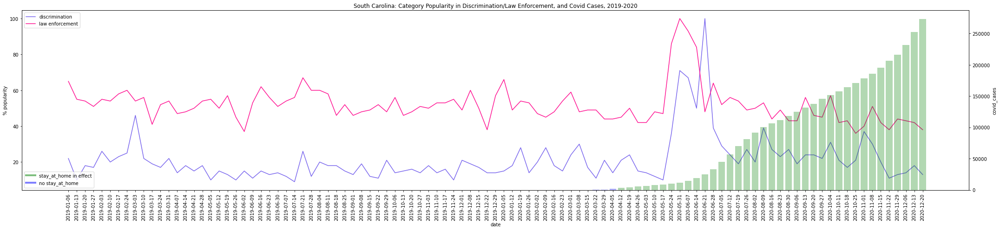

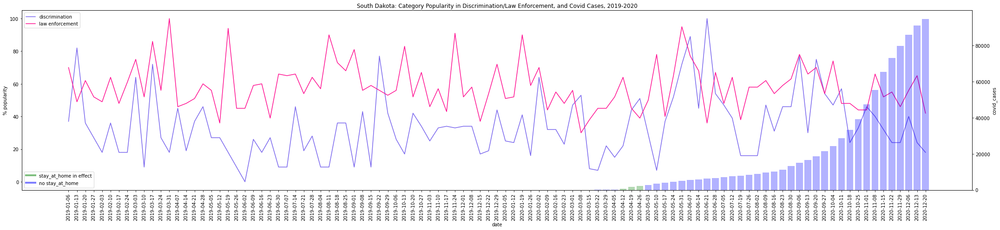

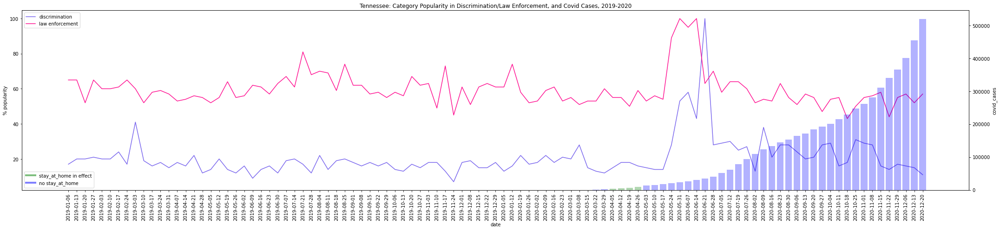

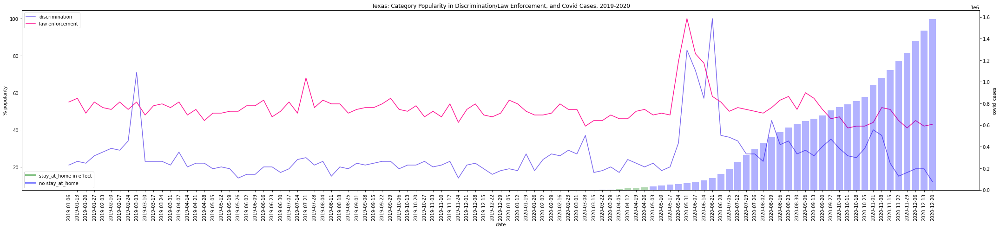

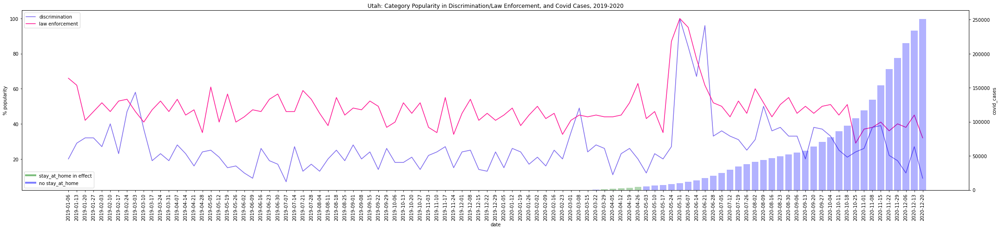

...

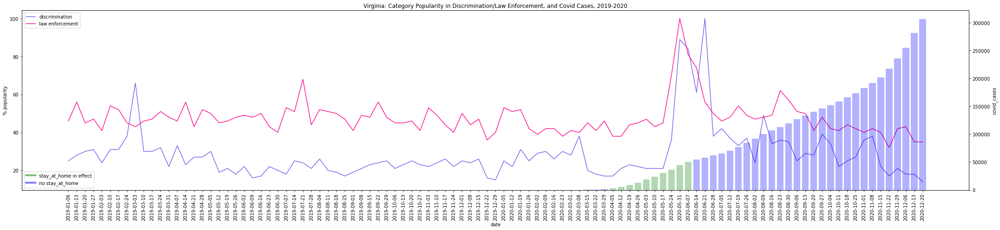

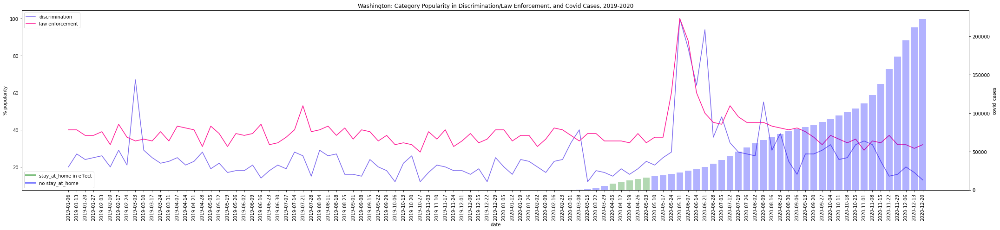

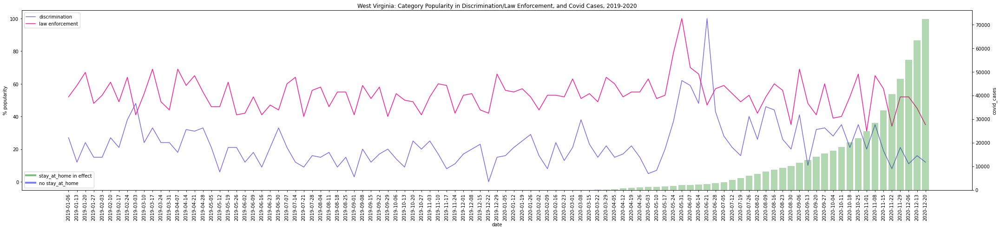

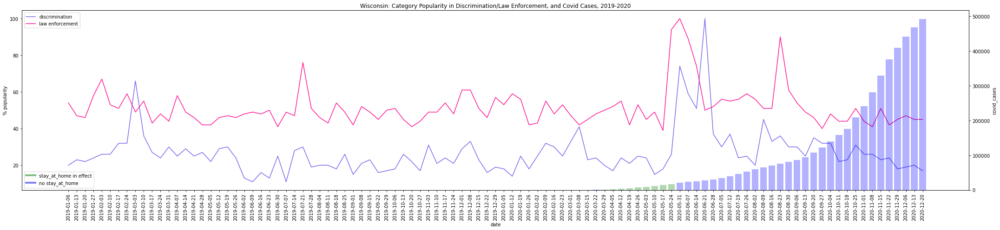

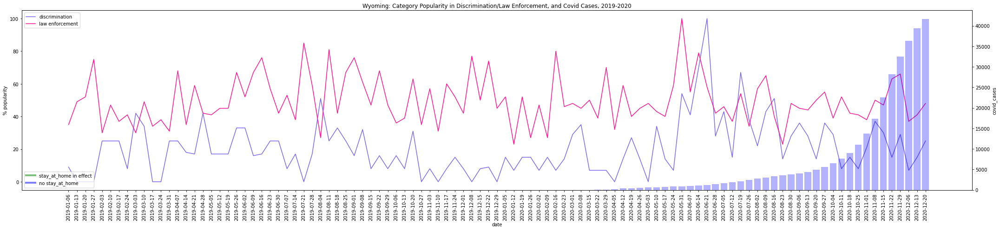

In [58]:
for x in range(40, 51):
    discrim_law_graph_maker(x)

In [59]:
def misc_select_graph_maker(ind_no):
    all_data_df = states_df_dict[f'{state_codes[ind_no]}_data_df'][0]
    
    graphs_time_list = [x for x in all_data_df['time']]
    init_covid_list = [x for x in all_data_df['covid_cases']]
    
    fig, ax = plt.subplots(figsize=(30,7))
    
    ax.plot(graphs_time_list, all_data_df['weather'], color='red', label='weather')

    ax.plot(graphs_time_list, all_data_df['autos'], color='lime', label='autos')

    ax.plot(graphs_time_list, all_data_df['beauty_fitness'], color='fuchsia', label='beauty & fitness')

    ax.plot(graphs_time_list, all_data_df['sport_news'], color='cyan', label='sports news')

    plt.xticks(graphs_time_list, rotation=90)

    plt.xlabel('date')
    plt.ylabel('% popularity')
    plt.legend(loc='upper left')
    plt.title(f'{state_names[ind_no]}: Category Popularity in Group Miscellaneous, and Covid Cases, 2019-2020')

    ax2 = ax.twinx()
    colour_list = []
    for x in all_data_df['stay_at_home']:
        if x == True:
            colour_list.append('green')
        else:
            colour_list.append('blue')
    ax2.set_ylabel('covid_cases')  
    ax2.bar(graphs_time_list, init_covid_list, color=colour_list, align='center', alpha=0.3)
    ax2.tick_params(axis='y')
    
    custom_lines = [Line2D([0], [0], color='green', alpha=0.5, lw=4),
                Line2D([0], [0], color='blue', alpha=0.5, lw=4)]

    ax2.legend(custom_lines, ['stay_at_home in effect', 'no stay_at_home'], loc='lower left')
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    
    plt.savefig(f'graphs_for_states/combined_2019_2020_graphs/misc/{state_names_for_files[ind_no]}_misc_cats_graph.png')

    plt.show()

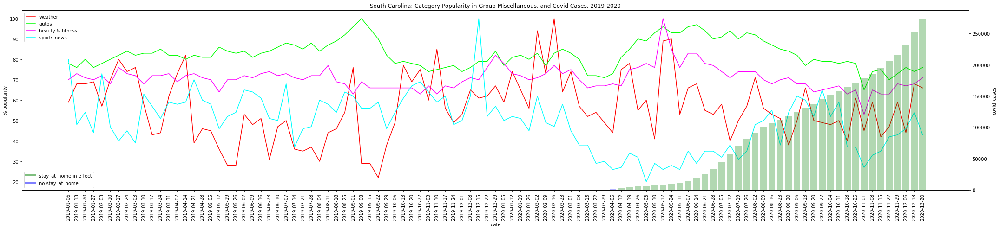

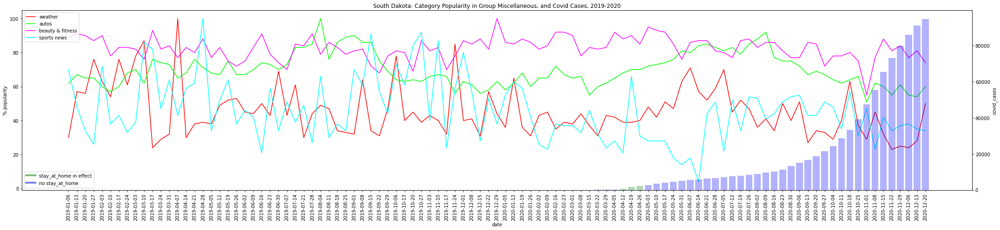

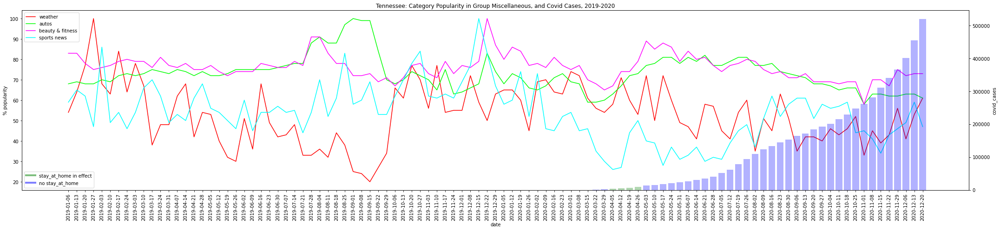

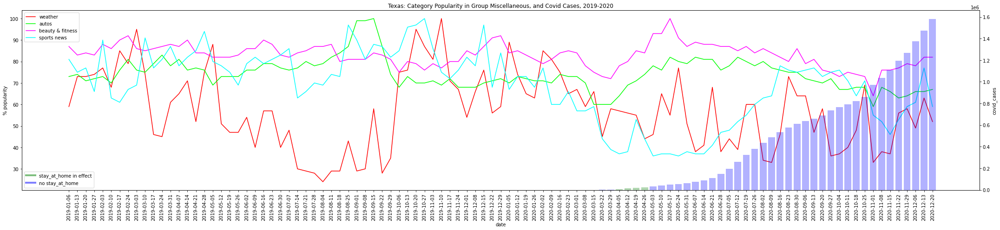

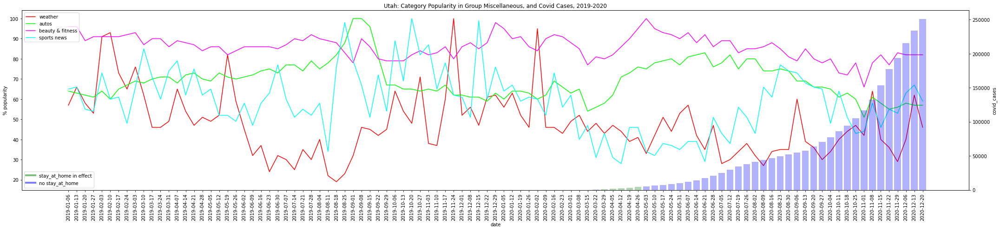

...

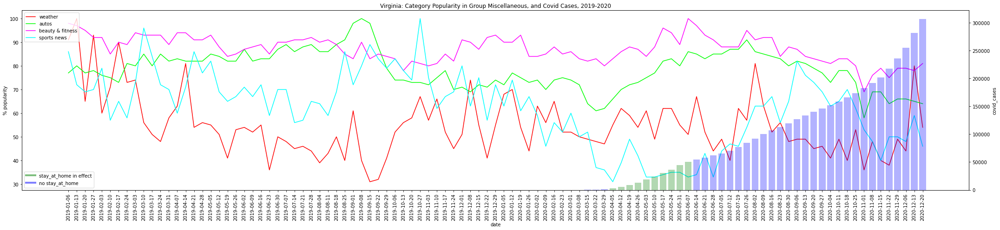

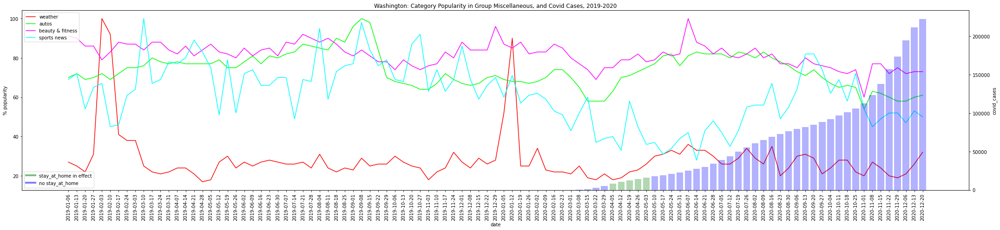

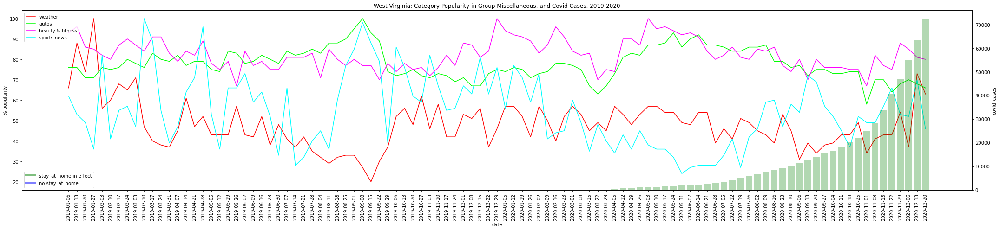

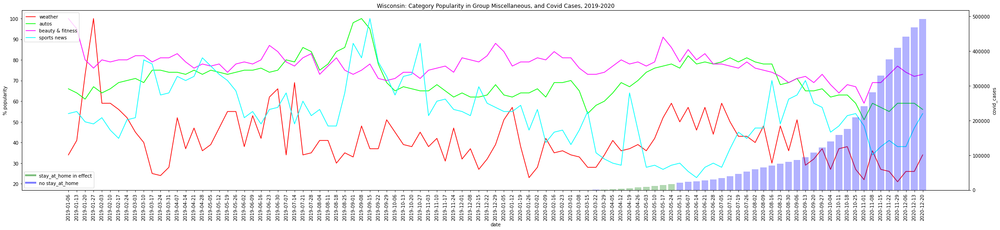

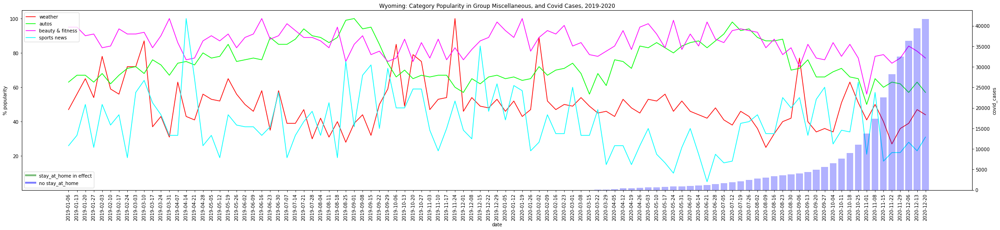

In [60]:
for x in range(40, 51):
    misc_select_graph_maker(x)